# Step 1: Install Requirements

In [2]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 10926, done.
remote: Total 10926 (delta 0), reused 0 (delta 0), pack-reused 10926
Receiving objects: 100% (10926/10926), 11.06 MiB | 23.79 MiB/s, done.
Resolving deltas: 100% (7546/7546), done.
/content/yolov5
     |████████████████████████████████| 596 kB 4.9 MB/s 
     |████████████████████████████████| 67 kB 3.0 MB/s 
     |████████████████████████████████| 178 kB 37.4 MB/s 
     |████████████████████████████████| 145 kB 44.0 MB/s 
     |████████████████████████████████| 1.1 MB 44.3 MB/s 
     |████████████████████████████████| 138 kB 49.2 MB/s 
     |████████████████████████████████| 63 kB 1.5 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium

In [1]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [2]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [3]:
#after following the link above, recieve python code with these fields filled in
from roboflow import Roboflow
rf = Roboflow(api_key="4macDQtdtEOsYehNAQYP")
project = rf.workspace().project("yolo_toi-c67r5")
dataset = project.version(5).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/yolo_toi-5 in yolov5pytorch:: 100%|██████████| 400/400 [00:00<00:00, 1153.23it/s]


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [7]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [2]:
# !python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images
!python yolov5/detect.py --weights F:/testcodeluanvan/model/24.03_more_data_train/v5M.pt --img 416 --conf 0.42 --source D:/nam5/nckh/data_raw/more_data
# !python yolov5/detect.py --weights F:/testcodeluanvan/model/24.03_more_data_train/v5M.pt --img 416 --conf 0.43 --source http://localhost:5000/video_feed
# !python yolov5/detect.py --weights F:/testcodeluanvan/model/24.03_more_data_train/v5M.pt --img 416 --conf 0.43 --source F:/testcodeluanvan/test2.wmv
# python yolov5/detect_copy.py --weights F:/testcodeluanvan/model/24.03_more_data_train/v5M.pt --img 416 --conf 0.42 --save-txt --source F:/testcodeluanvan/camera/save_img

detect: weights=['F:/testcodeluanvan/model/24.03_more_data_train/v5M.pt'], source=D:/nam5/nckh/data_raw/more_data, data=yolov5\data\coco128.yaml, imgsz=[416, 416], conf_thres=0.42, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5\runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5  v6.1-1-g66aaf51 torch 1.10.2+cpu CPU

Traceback (most recent call last):
  File "f:\testcodeluanvan\model\yolov5\detect.py", line 253, in <module>
    main(opt)
  File "f:\testcodeluanvan\model\yolov5\detect.py", line 248, in main
    run(**vars(opt))
  File "C:\Users\ASUS\anaconda3\envs\yolov5\lib\site-packages\torch\autograd\grad_mode.py", line 28, in decorate_context
    return func(*args, **kwargs)
  File "f:\testcodeluanvan\model\yolov5\detect.py", line 91, in run
    mode

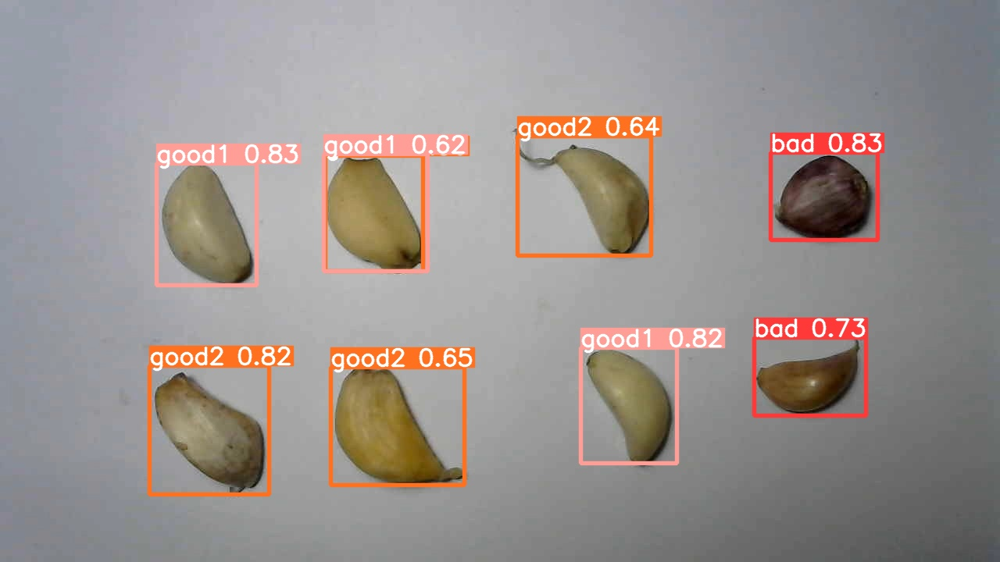

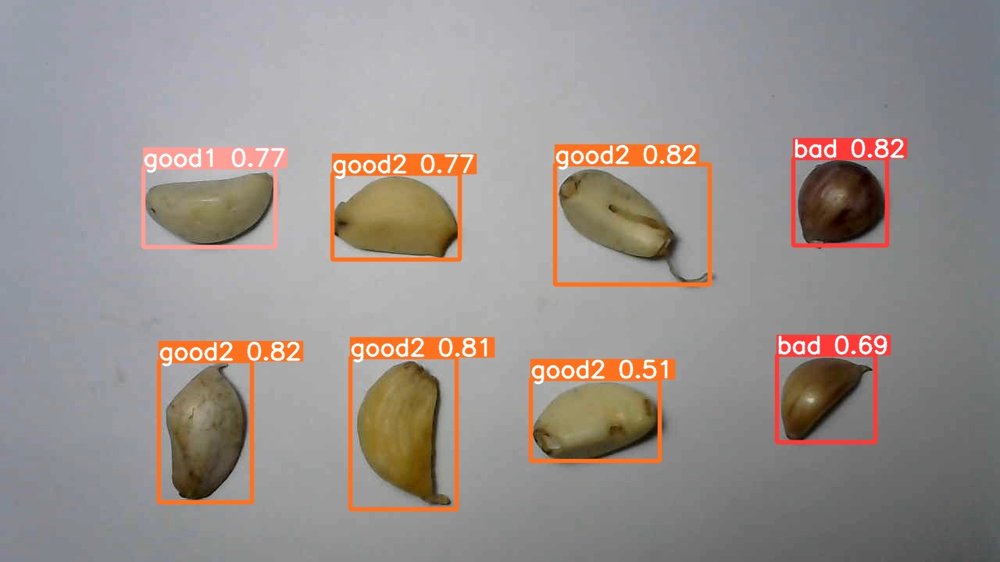

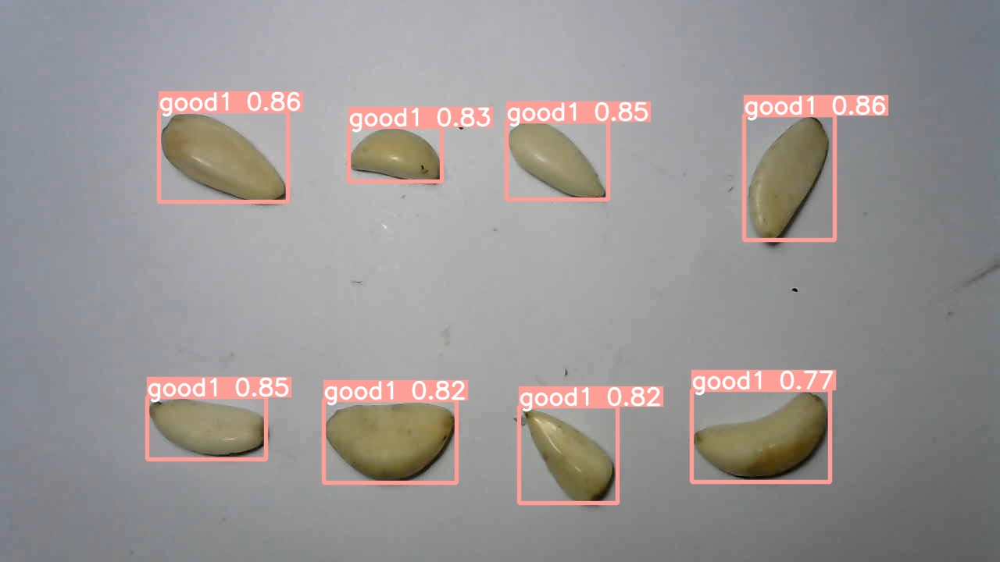

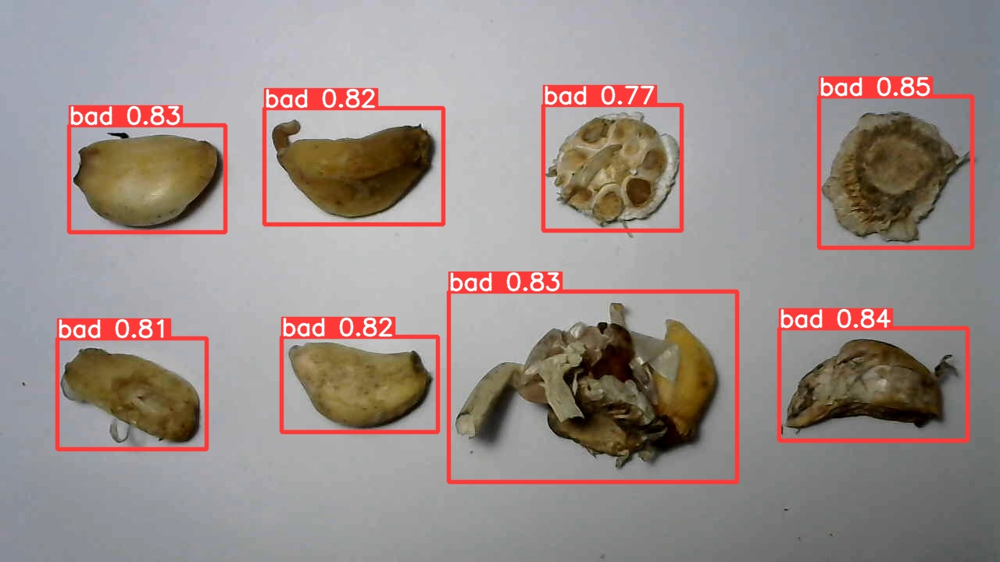

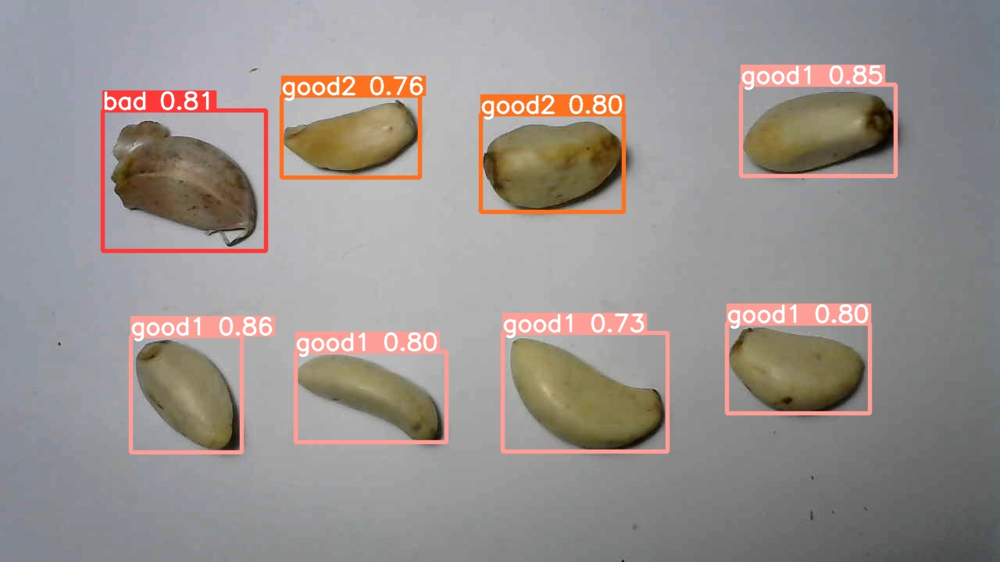

...

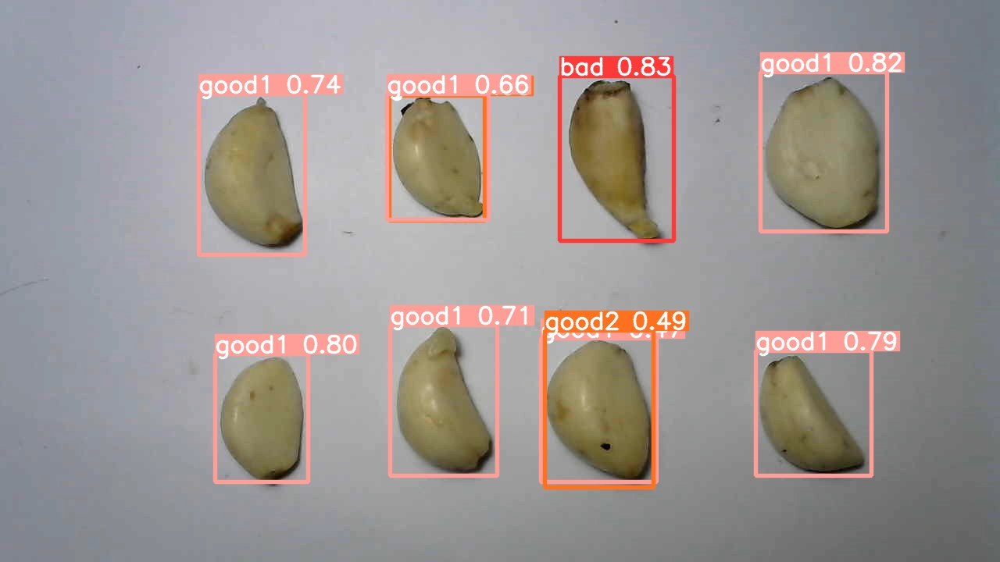

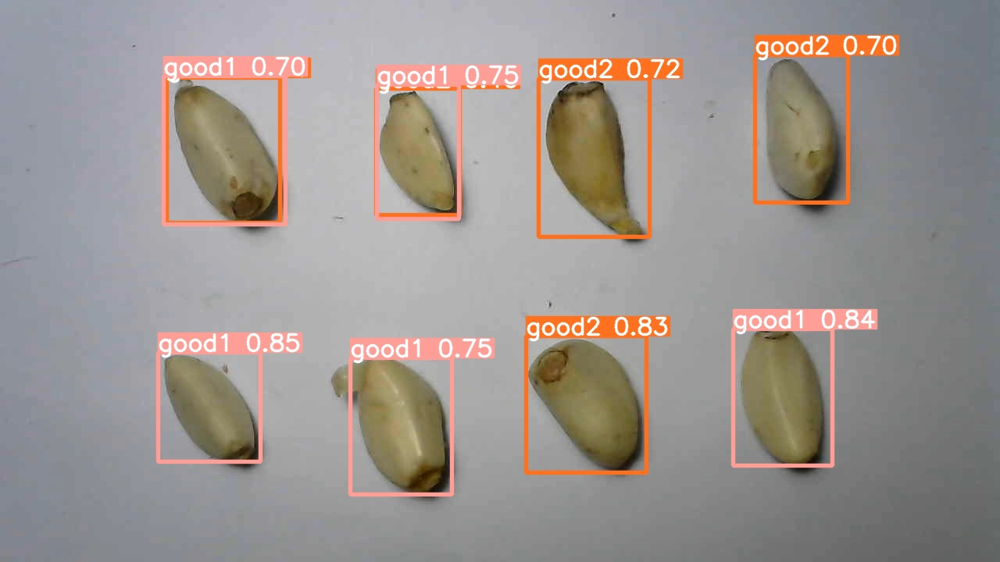

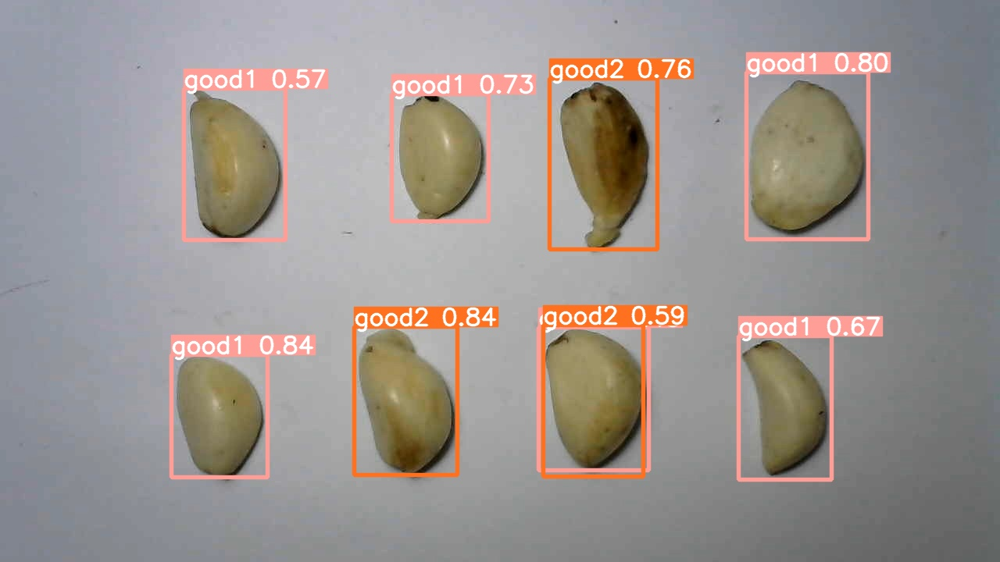

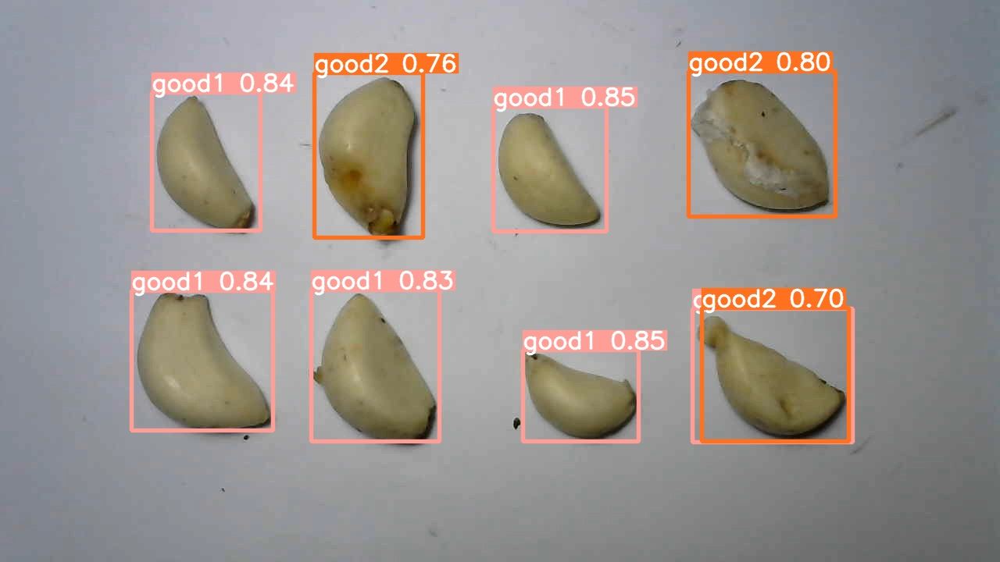

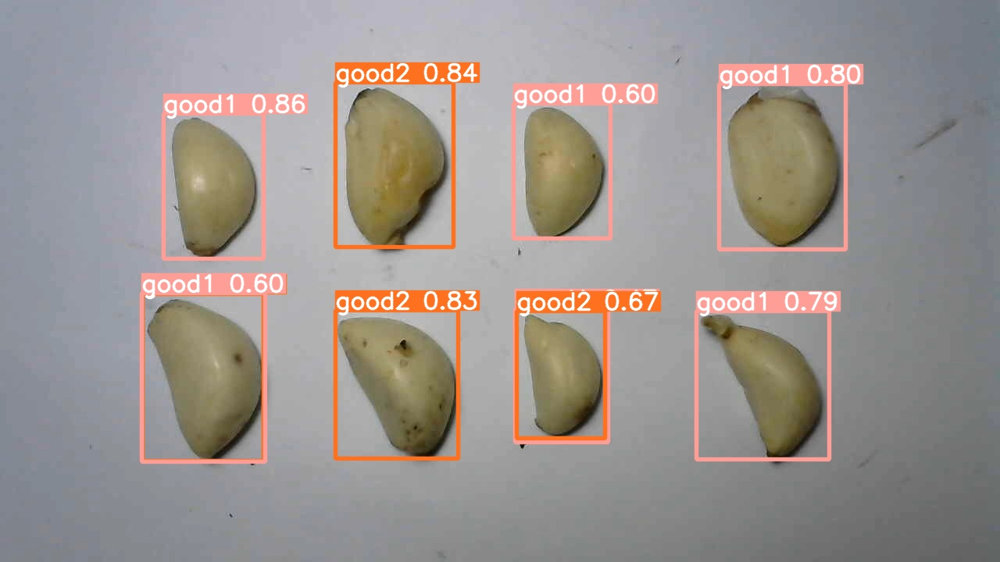

In [3]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('F:/testcodeluanvan/model/yolov5/runs/detect/exp49/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [13]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>